# Librerias

In [ ]:
!pip install imgaug scikit-image

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa
from tqdm import tqdm
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Configuraciones de la aplicación
WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")

# Tamaño de la imagen y configuración de la clase
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000  # Usa 1000 para explorar ideas, usa -1 para entrenamiento completo

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Explorando el Dataset

In [ ]:
import zipfile
import os
from tqdm import tqdm

# Ruta del archivo ZIP
zip_path = '/content/drive/MyDrive/TESIS/resized_cropped.zip'
# Ruta donde se descomprimirá el archivo
extract_path = '/content/drive/MyDrive/TESIS/dataset/'
# Crear el directorio de extracción si no existe
os.makedirs(extract_path, exist_ok=True)

# Función para extraer con barra de progreso
def extract_zip_with_progress(zip_path, extract_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        # Contar el número total de archivos en el ZIP
        total_files = len(zip_ref.namelist())

        # Inicializar la barra de progreso
        with tqdm(total=total_files, unit='file') as pbar:
            for file in zip_ref.namelist():
                zip_ref.extract(file, extract_path)
                # Actualizar la barra de progreso
                pbar.update(1)

# Descomprimir el archivo ZIP con barra de progreso
extract_zip_with_progress(zip_path, extract_path)

print(f'Archivo descomprimido en: {extract_path}')

100%|██████████| 35110/35110 [10:30<00:00, 55.68file/s]

Archivo descomprimido en: /content/drive/MyDrive/TESIS/dataset/


In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/TESIS/dataset/Labels.csv')

df_train.head()

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


In [ ]:
x = df_train['image']
y = df_train['level']
x, y = shuffle(x, y, random_state=SEED)

(29857,) (29857,) (5269,) (5269,)


<Axes: >

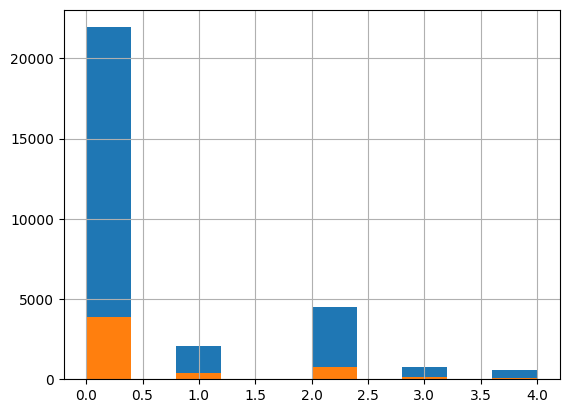

In [ ]:
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                      stratify=y, random_state=SEED)
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()

# Imagen Original

CPU times: user 976 ms, sys: 75.8 ms, total: 1.05 s
Wall time: 1.41 s


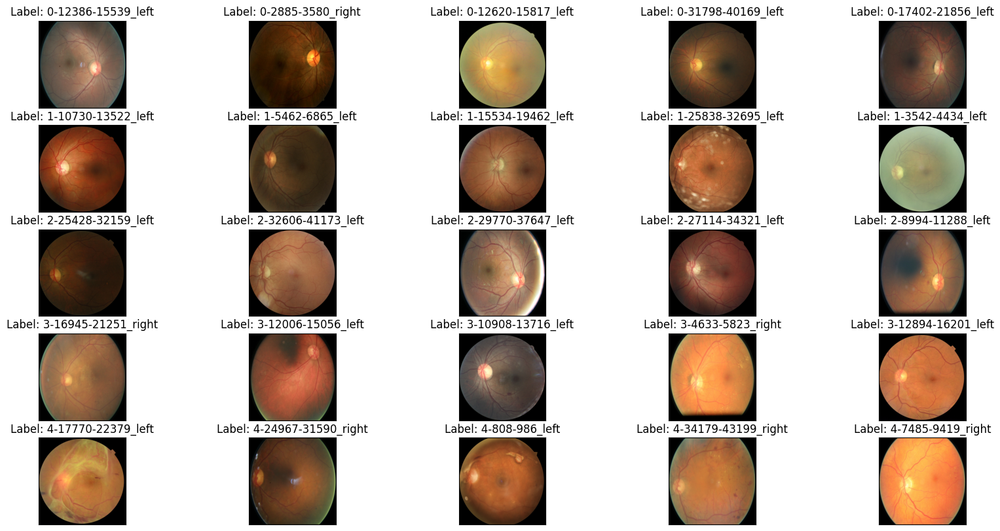

In [ ]:
%%time
fig = plt.figure(figsize=(20, 10))
# display 10 images from each class
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/drive/MyDrive/TESIS/dataset/resized_cropped/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['image']) )

# Escala de grises

CPU times: user 767 ms, sys: 52.6 ms, total: 819 ms
Wall time: 1.04 s


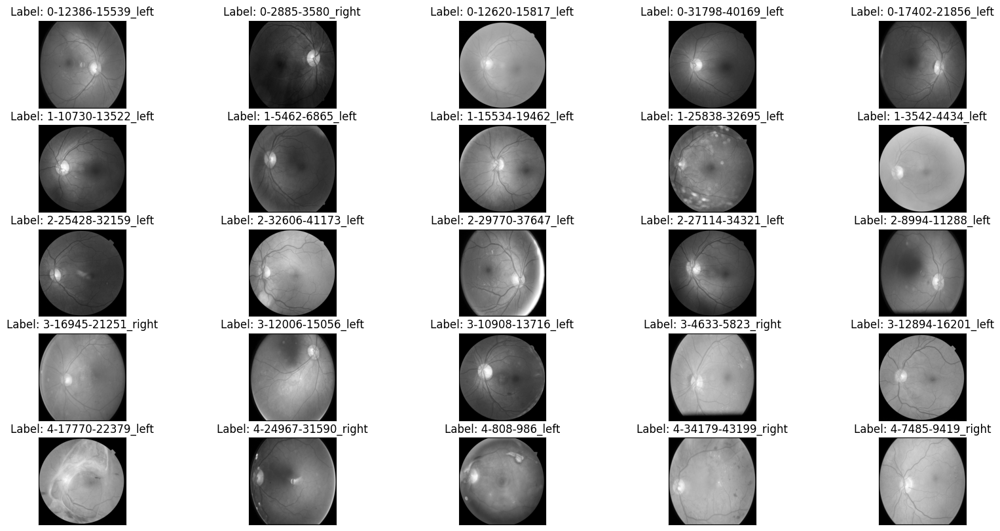

In [ ]:
%%time
fig = plt.figure(figsize=(20, 10))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/drive/MyDrive/TESIS/dataset/resized_cropped/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image=cv2.addWeighted ( image, 0 , cv2.GaussianBlur( image , (0 ,0 ) , 10) ,-4 ,128)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['image']) )

#Escala de grises con ajuste

CPU times: user 21.5 s, sys: 143 ms, total: 21.7 s
Wall time: 15.3 s


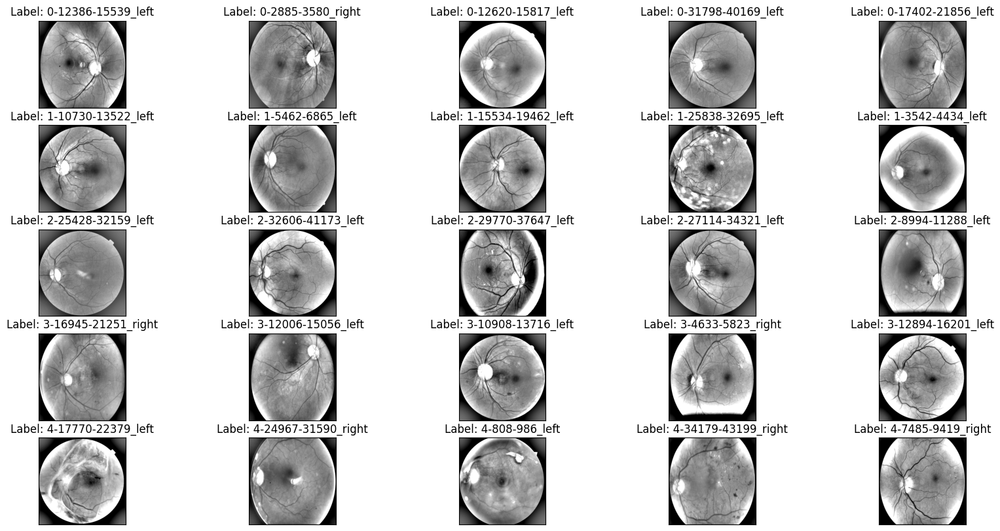

In [ ]:
%%time
fig = plt.figure(figsize=(20, 10))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/drive/MyDrive/TESIS/dataset/resized_cropped/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
       # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['image']) )

In [ ]:
def crop_image1(img,tol=7):
    # img is image data
    # tol  is tolerance

    mask = img>tol
    return img[np.ix_(mask.any(1),mask.any(0))]

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol

        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

# Imagen RGB con ajuste

In [ ]:
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)

    return image

CPU times: user 14.9 s, sys: 206 ms, total: 15.1 s
Wall time: 11.6 s


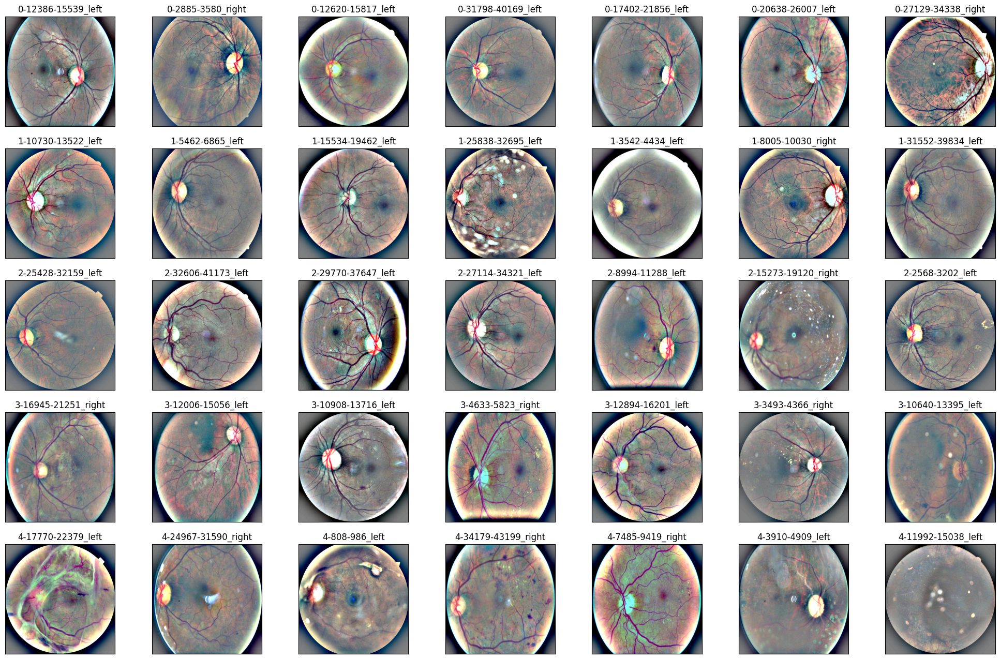

In [ ]:
%%time

NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"/content/drive/MyDrive/TESIS/dataset/resized_cropped/{row['image']}.jpeg"
        image = load_ben_color(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['image']) )

# Probando corte circular

In [ ]:
def circle_crop(img, sigmaX=10):
    """
    Create circular crop around image centre
    """

    img = cv2.imread(img)
    img = crop_image_from_gray(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    height, width, depth = img.shape

    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))

    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
    return img

CPU times: user 27.2 s, sys: 304 ms, total: 27.6 s
Wall time: 20.7 s


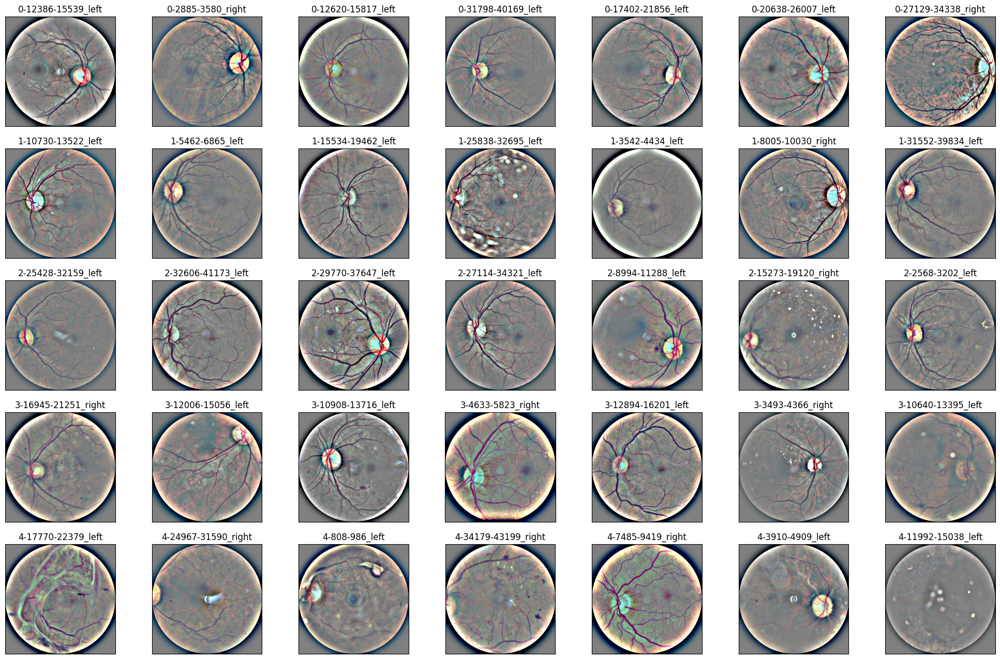

In [ ]:
%%time
## try circle crop
NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"/content/drive/MyDrive/TESIS/dataset/resized_cropped/{row['image']}.jpeg"
        image = circle_crop(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['image']) )

# Guardar imagenes procesadas

In [ ]:
processed_path = '/content/drive/MyDrive/TESIS/processed/'
os.makedirs(processed_path, exist_ok=True)

# Procesar y guardar todas las imágenes
def process_and_save_images(image_names, input_dir, output_dir):
    for image_name in tqdm(image_names, desc="Procesando imágenes"):
        input_path = os.path.join(input_dir, f"{image_name}.jpeg")
        output_path = os.path.join(output_dir, f"{image_name}.jpeg")

        # Verificar si el archivo existe
        if not os.path.exists(input_path):
            print(f"Error: El archivo {input_path} no existe.")
            continue

        # Cargar y preprocesar la imagen
        processed_image = load_ben_color(input_path, sigmaX=30)

        # Si el preprocesamiento falló, omitir la imagen
        if processed_image is None:
            continue

        # Guardar la imagen preprocesada
        cv2.imwrite(output_path, cv2.cvtColor(processed_image, cv2.COLOR_RGB2BGR))

# Aplicar preprocesamiento y guardar las imágenes
process_and_save_images(df_train['image'], extract_path, processed_path)

print(f'Imágenes procesadas y guardadas en: {processed_path}')

Procesando imágenes:   2%|▏         | 632/35126 [03:16<2:34:44,  3.72it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/766_left.jpeg no existe.


Procesando imágenes:   4%|▎         | 1264/35126 [06:26<2:23:38,  3.93it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/1557_left.jpeg no existe.


Procesando imágenes:   4%|▍         | 1578/35126 [07:59<2:18:05,  4.05it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/1986_left.jpeg no existe.


Procesando imágenes:   9%|▉         | 3090/35126 [15:41<2:12:04,  4.04it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/3829_left.jpeg no existe.


Procesando imágenes:  22%|██▏       | 7604/35126 [38:22<3:05:47,  2.47it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/9590_left.jpeg no existe.
Error: El archivo /content/drive/MyDrive/TESIS/dataset/9590_right.jpeg no existe.


Procesando imágenes:  25%|██▍       | 8754/35126 [44:09<1:53:37,  3.87it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/10996_left.jpeg no existe.


Procesando imágenes:  34%|███▍      | 12118/35126 [1:00:55<1:33:57,  4.08it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/15222_left.jpeg no existe.


Procesando imágenes:  35%|███▍      | 12214/35126 [1:01:28<1:58:47,  3.21it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/15324_left.jpeg no existe.


Procesando imágenes:  43%|████▎     | 15150/35126 [1:16:09<1:23:20,  3.99it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/18972_left.jpeg no existe.


Procesando imágenes:  48%|████▊     | 16844/35126 [1:24:42<1:15:56,  4.01it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/21118_left.jpeg no existe.


Procesando imágenes:  49%|████▉     | 17300/35126 [1:26:59<1:22:48,  3.59it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/21720_left.jpeg no existe.


Procesando imágenes:  59%|█████▉    | 20676/35126 [1:43:56<1:40:18,  2.40it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/26064_left.jpeg no existe.
Error: El archivo /content/drive/MyDrive/TESIS/dataset/26064_right.jpeg no existe.


Procesando imágenes:  73%|███████▎  | 25497/35126 [2:08:04<1:09:31,  2.31it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/32253_right.jpeg no existe.


Procesando imágenes:  78%|███████▊  | 27406/35126 [2:17:40<49:47,  2.58it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/34689_left.jpeg no existe.


Procesando imágenes:  95%|█████████▍| 33342/35126 [2:51:57<13:16,  2.24it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/42119_left.jpeg no existe.


Procesando imágenes:  98%|█████████▊| 34388/35126 [2:59:37<07:03,  1.74it/s]

Error: El archivo /content/drive/MyDrive/TESIS/dataset/43457_left.jpeg no existe.


Procesando imágenes: 100%|██████████| 35126/35126 [3:05:14<00:00,  3.16it/s]

Imágenes procesadas y guardadas en: /content/drive/MyDrive/TESIS/processed/
